# Описание проекта

Мы работаем в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”). Наши пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала. mountains and clouds. Отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Например, такое: A man is crossing a mountain pass on a metal bridge. Сервис выводит несколько фотографий с такой же или похожей сценой.

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать так называемый PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Мне поручено разработать демонстрационную версию поиска изображений по запросу. Для демонстрационной версии нужно выбрать лучшую модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу.

На основе лучшей модели можно будет собрать предварительную версию продукта, которую вы покажете руководителю компании.

**Юридические ограничения**

В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет. В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер: This image is unavailable in your country in compliance with local laws. Однако в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.

**Описание данных**

В файле train_dataset.csv находится информация, необходимая для обучения:

имя файла изображения
идентификатор описания и текст описания.
Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке train_images содержатся изображения для тренировки модели.
В файле CrowdAnnotations.tsv — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:
Имя файла изображения.
Идентификатор описания.
Доля людей, подтвердивших, что описание соответствует изображению.
Количество человек, подтвердивших, что описание соответствует изображению.
Количество человек, подтвердивших, что описание не соответствует изображению.
В файле ExpertAnnotations.tsv — данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
Имя файла изображения.
Идентификатор описания.
3, 4, 5 — оценки трёх экспертов.
Эксперты ставят оценки по шкале от 1 до 4, где:

1 — изображение и запрос совершенно не соответствуют друг другу
2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует
3 — запрос и текст соответствуют с точностью до некоторых деталей
4 — запрос и текст соответствуют полностью.
В файле test_queries.csv находится информация, необходимая для тестирования:
идентификатор запроса
текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>. В папке test_images содержатся изображения для тестирования модели.

In [1]:
#!wget -N https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
#!unzip -uq dsplus_integrated_project_4.zip
#print('-' * 100)
#!ls

In [2]:
!pip install -q --upgrade keras-nlp tensorflow
!pip install -q sentence-transformers

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pickle

import nltk
import re
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
!unzip -u /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/nltk_data/corpora/

from PIL import Image

from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Flatten, Dropout, BatchNormalization)
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow import keras
import tensorflow as tf
import keras_nlp
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras import backend as K

from tqdm import notebook

from sklearn.model_selection import GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyRegressor

import sentence_transformers
from sentence_transformers import SentenceTransformer, util
import glob
from collections import Counter
from keras.applications.resnet import preprocess_input
from sentence_transformers import SentenceTransformer, util
from IPython.display import display
from IPython.display import Image as IPImage
import os
from functools import lru_cache

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\glebs\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\glebs\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\glebs\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\glebs\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
"unzip" не является внутренней или внешней
командой, исполняемой программой или пакетным файлом.


Using TensorFlow backend


C:\Users\glebs\anaconda3\envs\tensorflow-gpu\lib\site-packages\sentence_transformers\cross_encoder\CrossEncoder.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


#!pip install tensorflow
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input
from pathlib import Path
from functools import lru_cache

In [4]:
path = 'data'
SEED = 42
block = ['teenage', 'baby', 'child', 'teenager', 'girl','boy', 'baby', 'boy', 'boys'
        , 'girls', 'girl', 'kid', 'kids', 'youngster', 'youth', 'young', 'babe']

np.random.seed(SEED)
tf.random.set_seed(SEED)

# Исследовательский анализ данных
Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения. В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Мы можем воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

- Доля исполнителей, подтвердивших, что текст соответствует картинке.
- Количество исполнителей, подтвердивших, что текст соответствует картинке.
- Количество исполнителей, подтвердивших, что текст не соответствует картинке.
После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4. Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до

## Загрузка данных

In [5]:
def read_df(path=path) -> pd.DataFrame:

    df_train = pd.read_csv(Path(path, 'train_dataset.csv'))
    df_crowd = pd.read_csv(Path(path, 'CrowdAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
    df_expert = pd.read_csv(Path(path, 'ExpertAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'first', 'second', 'third'])
    df_queries = pd.read_csv(Path(path, 'test_queries.csv'), index_col=[0], sep='|')
    df_images = pd.read_csv(Path(path, 'test_images.csv'), sep='|')

    return df_train, df_crowd, df_expert, df_queries, df_images

df_train, df_crowd, df_expert, df_queries, df_images = read_df()

## Тренировочные данные

В файле train_dataset.csv находится информация, необходимая для обучения:

- имя файла изображения
- идентификатор описания
- текст описания

Для одной картинки может быть доступно до 5 описаний.

Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

In [6]:
df_train.head(10)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [8]:
print('Количество уникальных описаний:', len(df_train.query_text.unique()))
print('Количество уникальных изображений:', len(df_train.image.unique()))

Количество уникальных описаний: 977
Количество уникальных изображений: 1000


In [9]:
# Смотри наиболее частые слова в описаниях

stops = set(stopwords.words('english'))
def mostCommonWords(concordanceList):
    finalCount = Counter()
    for line in concordanceList:
        line = re.sub('[^a-zA-Z]', ' ', line).lower()
        words = [w for w in line.split(" ") if w not in (stops)]
        finalCount.update(words)
    return finalCount.most_common(10)

most_common_words = pd.DataFrame(mostCommonWords(df_train["query_text"]), columns=['word','count']).reset_index()

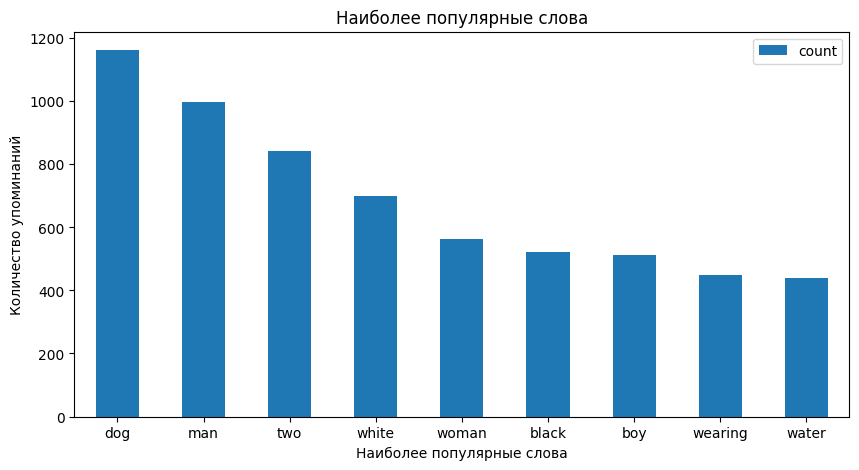

In [10]:
fig, ax = plt.subplots(figsize=(10,5))
most_common_words[most_common_words['word'] != ''].plot(kind='bar', x='word', y='count',
                                                        ax=ax, rot=0, title='Наиболее популярные слова')
ax.set_xlabel('Наиболее популярные слова')
ax.set_ylabel('Количество упоминаний')
plt.show()

## Оценка краудсорсинга

В файле CrowdAnnotations.tsv — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

- Имя файла изображения.
- Идентификатор описания.
- Доля людей, подтвердивших, что описание соответствует изображению.
- Количество человек, подтвердивших, что описание соответствует изображению.
- Количество человек, подтвердивших, что описание не соответствует изображению.

In [11]:
df_crowd.head()

,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [12]:
df_crowd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   share_pos  47830 non-null  float64
 3   count_pos  47830 non-null  int64  
 4   count_neg  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [13]:
def pos_neg_count(df, field_1, field_2):
    percent_dict = {'Оценка': ['Верные описания', 'Не верные описания'],
                    'Процент от общего числа записей':[
                        df[df[field_1] > 0]['query_id'].count() / df.shape[0],
                        df[df[field_2] > 0]['query_id'].count() / df.shape[0]
                    ]
                   }

    data = pd.DataFrame(percent_dict)
    fix, ax  = plt.subplots(figsize=(10, 5))
    data.plot(kind='barh', y='Процент от общего числа записей', x='Оценка',
              ax=ax, title='Соотношение изображений к верным и не верным описаниям')
    ax.set_ylabel('Оценка')
    ax.set_xlabel('Доля оценок')
    plt.show()

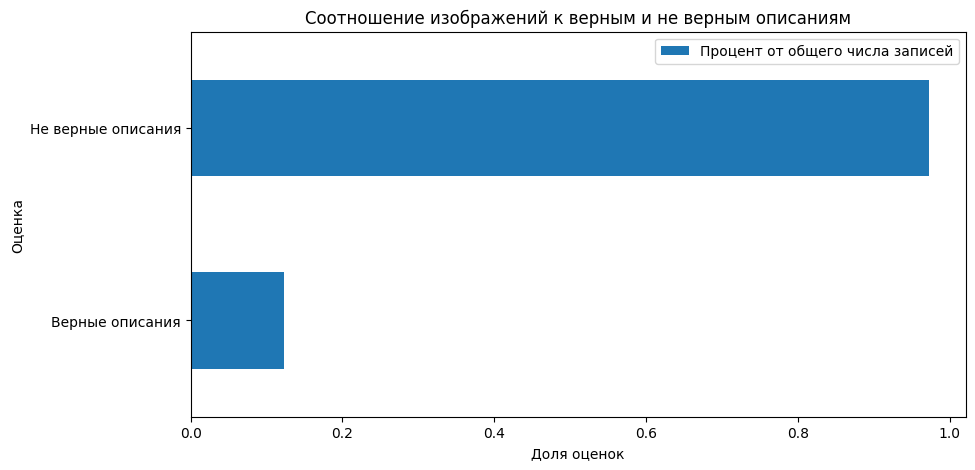

In [14]:
pos_neg_count(df_crowd, 'count_pos', 'count_neg')

## Оценка экспертов

В файле ExpertAnnotations.tsv — данные по соответствию изображения и описания, полученные в результате опроса экспертов.

Номера колонок и соответствующий тип данных:

- Имя файла изображения.
- Идентификатор описания.
- 3, 4, 5 — оценки трёх экспертов.
Эксперты ставят оценки по шкале от 1 до 4, где:

1 — изображение и запрос совершенно не соответствуют друг другу<br>
2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует<br>
3 — запрос и текст соответствуют с точностью до некоторых деталей<br>
4 — запрос и текст соответствуют полностью.

In [15]:
df_expert.head()

,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [16]:
df_expert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   first     5822 non-null   int64 
 3   second    5822 non-null   int64 
 4   third     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


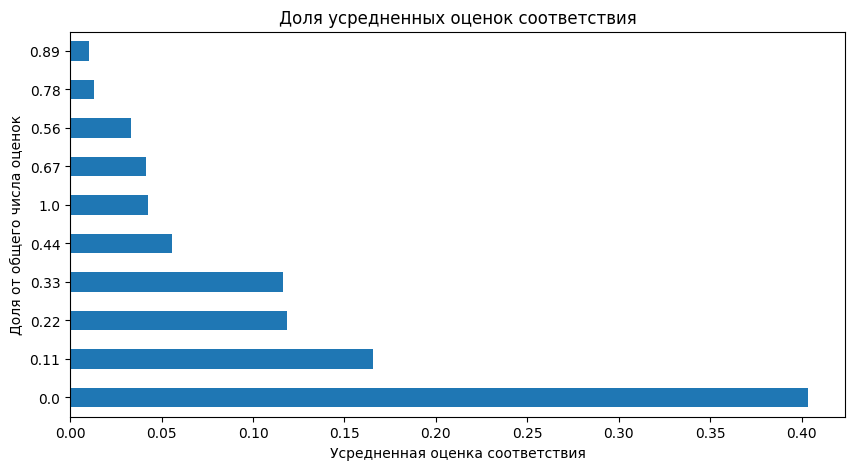

In [17]:
mean_ranks = ((((df_expert['first'] + df_expert['second'] + df_expert['third']) - 3) / 9)
              .round(2).value_counts() / df_expert.shape[0])

fig, ax = plt.subplots(figsize=(10,5))
mean_ranks.plot(kind='barh', title='Доля усредненных оценок соответствия', ax=ax)
ax.set_xlabel('Усредненная оценка соответствия')
ax.set_ylabel('Доля от общего числа оценок')
plt.show()

## Тестовые запросы

В файле test_queries.csv находится информация, необходимая для тестирования:

- идентификатор запроса
- текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний.
- Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

In [18]:
df_queries.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [19]:
df_queries.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


## Общий анализ

In [20]:
print('Количество уникальных фото на трейне:', len(df_train['image'].unique()))
print('Количество уникальных фото на тесте:', len(df_queries['image'].unique()))

Количество уникальных фото на трейне: 1000
Количество уникальных фото на тесте: 100


In [21]:
print('Количество уникальных запросов на тесте:', df_queries.drop_duplicates().shape[0])

Количество уникальных запросов на тесте: 500


In [22]:
print('Количество уникальных сочетаний фото-текст оцененных экспертами:', df_expert.drop_duplicates().shape[0])
print('Количество уникальных сочетаний фото-текст оцененных людьми:', df_crowd.drop_duplicates().shape[0])

Количество уникальных сочетаний фото-текст оцененных экспертами: 5822
Количество уникальных сочетаний фото-текст оцененных людьми: 47830


In [23]:
print('Уникальных текстовых описаний в трейне:', len(set(df_train['query_text'])))
print('Уникальных текстовых описаний в тесте:', len(set(df_queries['query_text'])))
print('Уникальных текстовых описаний которые есть в обоих наборах:', len(set(df_train['query_text']) & set(df_queries['query_text'])))

Уникальных текстовых описаний в трейне: 977
Уникальных текстовых описаний в тесте: 500
Уникальных текстовых описаний которые есть в обоих наборах: 0


In [24]:
print('Уникальных картинок в трейне:', len(set(df_train['image'])))
print('Уникальных картинок в тесте:', len(set(df_queries['image'])))
print('Уникальных картинок которые есть в обоих наборах:', len(set(df_train['image']) & set(df_queries['image'])))

Уникальных картинок в трейне: 1000
Уникальных картинок в тесте: 100
Уникальных картинок которые есть в обоих наборах: 0


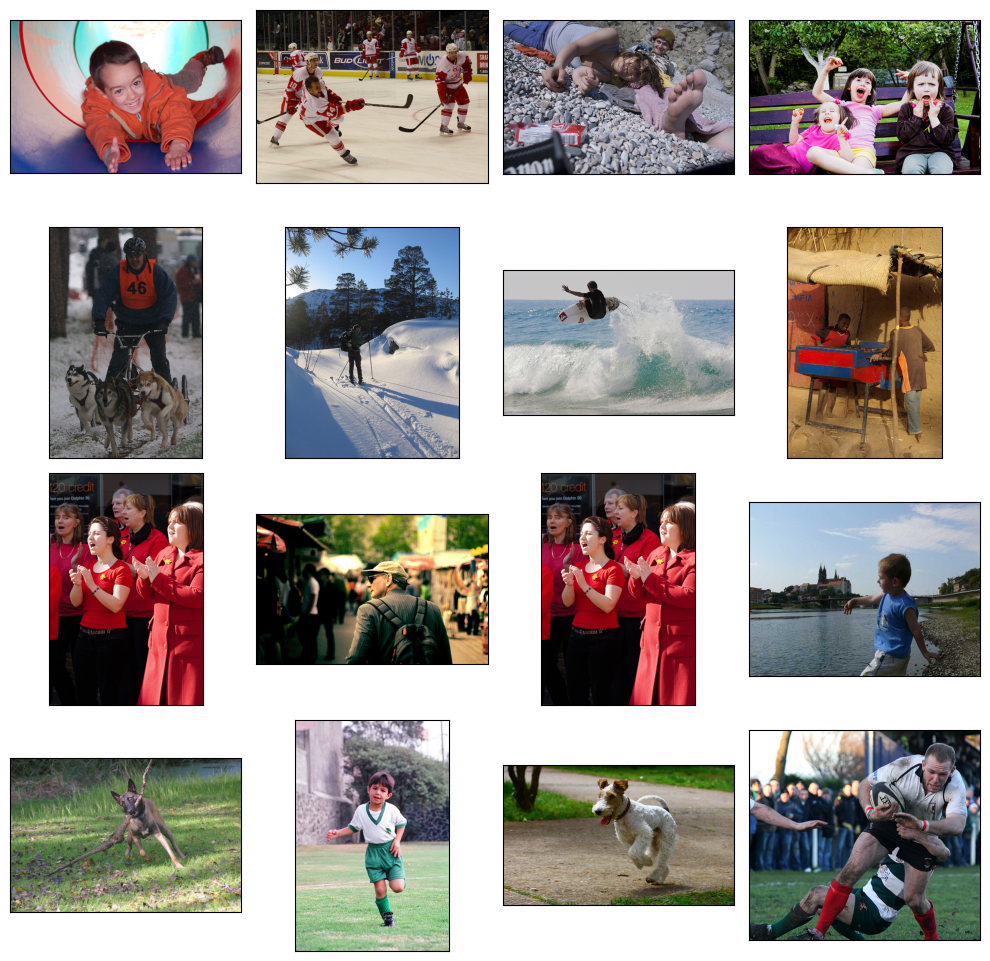

In [25]:
samples_train = list(df_train['image'].sample(8))
samples_test = list(df_queries['image'].sample(8))

fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(path, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(path, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

## Выводы


Заказчик предоставил 1000 картинок на тест и 100 на трейн. Есть предобработанные файлы с сочетаниями описаний и картинок, для трейна и теста.

Для трейна при этом есть как экспертные оценки соответствия 5822 шт. так и оценки выполненные на краудфайдинговой платформе обычными людьми - 47830 шт, они частично совпадают.

Большинство оценок в обоих методах оценки приближены к низкому соответствию описания изображению, что может сказаться на качестве обучаемой модели.

Пересечений между наборами данных для трейна и теста не обнаружено.

На трейне использованы только описания картинок под номером #2, в тесте же к каждой картинке даны по 5 описаний.

# Преобразование оценок

В случае, где 2/3 оценок совпадают - та  оценка станет финальной, в случаях, где все оценки разные - усредним.

Итоговую оценку приведет к диапазону [0, 1]

In [26]:
def expert_aggregate(row) -> object:

    if row['first'] != row['second'] != row['third']: #если оценки разные усредняем
        row['expert_score'] = (row['first'] + row['second'] + row['third'] - 3) / 3 / 3

    else: #если есть одинаковые оценки - аггрегируем голосованием
        row['expert_score'] = (max(set([row['first'], row['second'], row['third']]), key = [row['first'], row['second'], row['third']].count) - 1) / 3

    return row

df_expert = df_expert.apply(expert_aggregate, axis=1)

In [27]:
df_expert.head()

,image,query_id,first,second,third,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000


Всего 2329 пар каритнка-текст были оценены и людьми и экспертами.

Поэтому к экспертным оценкам мы левым джойном присоединим оценик краудсорса, тогда у части картинок будет смешанная оценка, а у дргой - экспертная.

Выбор пал именно на экспертную оценку, потому что по логике она более надежна. (почему для остальных берем экспертную, а не краудсорсинг)

In [28]:
df_scores = pd.merge(df_expert, df_crowd, on=['image', 'query_id'], how='left')

def score_aggregate(row) -> object:


    if np.isnan(row['expert_score']):
        row['score'] = row['share_pos']
    elif np.isnan(row['share_pos']):
        row['score'] = row['expert_score']
    else:
        row['score'] = row['expert_score'] * 0.7 + row['share_pos'] * 0.3

    return row

df_scores = df_scores.apply(score_aggregate, axis=1)

In [29]:
df_scores.head()

,image,query_id,first,second,third,expert_score,share_pos,count_pos,count_neg,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000,0.0,0.0,3.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000,0.0,0.0,3.0,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000,NaN,NaN,NaN,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333,NaN,NaN,NaN,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000,NaN,NaN,NaN,0.000000


Можно, конечно, было объединить через outer и тогда оценки были бы такими:
1. оценка эксперта
2. общая оценка
3. оценка краудсорсинга

Но тогда большая оценок была бы краудсорсинговой, а их оценка менее надежна, с другой стороны больше данных

В моем случае данных меньше, но оценка по идее должна быть надежнее. Если бы экспертных оценок было бы совсем мало, в таком случае нужно было бы использовать outer соединение, в нашем случае оценок вполне достаточно

In [30]:
display(df_scores['score'].isna().value_counts())
df_scores['score'].describe()

score
False    5822
Name: count, dtype: int64

count    5822.000000
mean        0.183894
std         0.264845
min         0.000000
25%         0.000000
50%         0.000000
75%         0.333333
max         1.000000
Name: score, dtype: float64

In [31]:
df_train = pd.merge(df_train, df_scores[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [32]:
df_train[df_train['query_text'].isna()]

,image,query_id,query_text,score


In [33]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   score       5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


## Вывод

Обработали оценки - выбрали метод аггрегирования, объединили два типа оценок

# Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

This image is unavailable in your country in compliance with local laws

Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Для избавления от нелегального контента мы воспользуемся текстовыми описаниями файлов.

Объявим список слов для поиска нелегального контента.

Очистим, токенизируем и лемматизируем текст, чтобы было легче искать запросы связанные с детьми. Отметим в обучающем наборе фото подлежащие блокировке.

In [34]:
lemmatize = nltk.WordNetLemmatizer()

def get_lemmas(text) -> list:

    text = re.sub('[^a-zA-Z]', ' ', text).lower()
    text = nltk.word_tokenize(text, language = 'english')
    text = [lemmatize.lemmatize(word) for word in text]

    return text

def cleaning(row) -> object:


    text = get_lemmas(row['query_text'])
    if [i for i in text if i in block]:
        row['to_block'] = 1
    else:
        row['to_block'] = 0

    return row

In [35]:
df_train = df_train.apply(cleaning, axis=1)

In [36]:
df_train.head()

,image,query_id,query_text,score,to_block
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,1
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,1
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.233333,1
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000,1
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,1


In [37]:
bad_images = set(list(df_train[df_train['to_block'] == 1]['query_id'].apply(lambda x: x[:-2].lower()).unique()))

In [38]:
print('Всего "плохих" изображений:',len(bad_images))

Всего "плохих" изображений: 300


In [39]:
print(df_train[df_train['to_block'] == 1]['query_text'].sample(10).unique())

['Two children , one of which is holding a stick , are standing on the beach as the sun begins to set .'
 'A boy is on the beach with a paddle in his hand as he walks through the ocean water .'
 'A little girl runs on the wet sand near the ocean .'
 'A little boy in a purple shirt and blue shorts playing with orange balls .'
 'A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .'
 'girl posing on tree'
 'People at park sitting on benches and a woman taking care of her child in the stroller .'
 'a boy jumps into the blue pool water .'
 'A young child is wearing blue goggles and sitting in a float in a pool .'
 'A young girl plays in fountain water .']


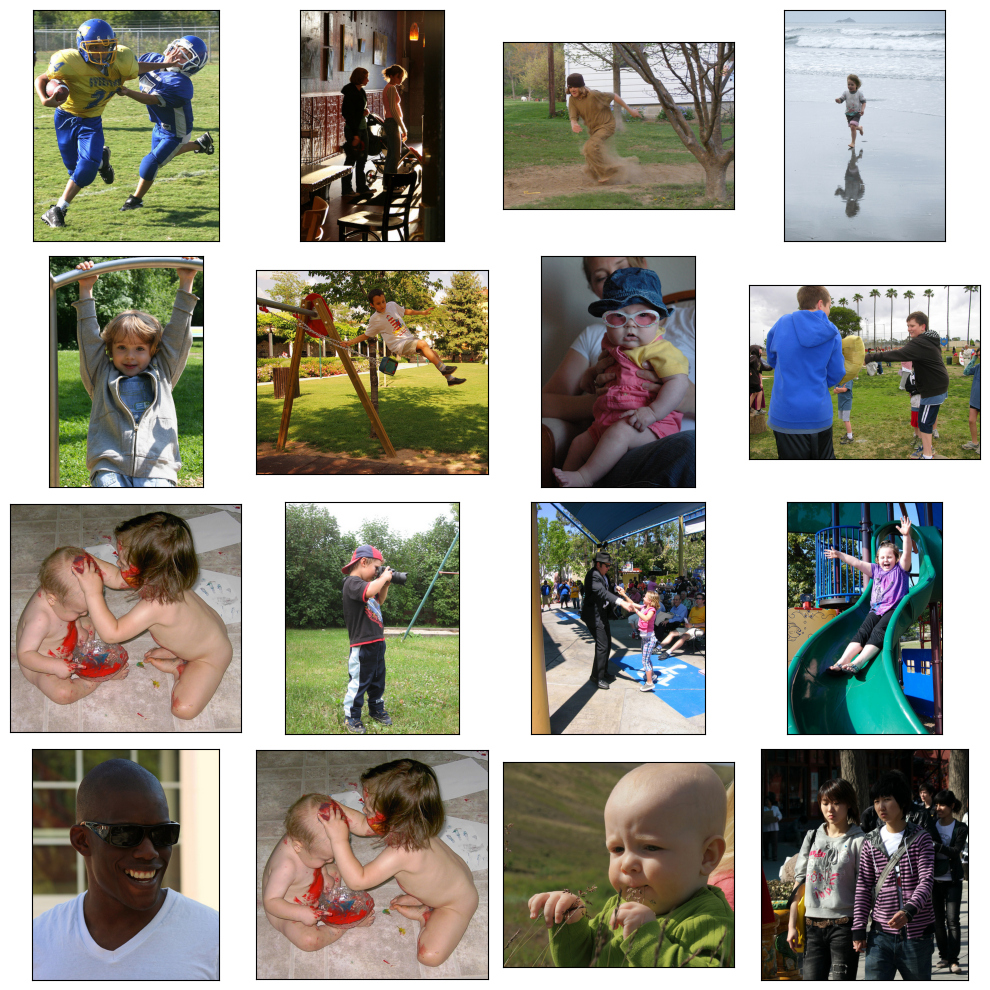

In [40]:
samples = list(df_train[df_train['to_block'] == 1]['query_id'].sample(16))
samples = [i[:-2] for i in samples]

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(path, 'train_images', samples[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

In [41]:
df_train.drop(df_train.query('image in @bad_images').index, inplace=True, errors='ignore')
df_train.drop(columns='to_block', inplace=True, errors='ignore')
df_train.reset_index(inplace=True, drop=True)

In [42]:
display(df_train.head())
df_train.info()
print('-' * 100)

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4028 entries, 0 to 4027
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4028 non-null   object 
 1   query_id    4028 non-null   object 
 2   query_text  4028 non-null   object 
 3   score       4028 non-null   float64
dtypes: float64(1), object(3)
memory usage: 126.0+ KB
----------------------------------------------------------------------------------------------------


## Выводы

Провели проверку данных на наличие запрещенных картинок, после удалили таковые

# Векторизация изображения

Воспользуемся свёрточными сетями: они позволяют выделить главные компоненты изображений.

Возьмём архитектуру ResNet-50, посмотрим на слои и исключим полносвязные слои, которые отвечают за конечное предсказание. При этом загрузим модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Создадим функции загрузчиков изображений.

In [43]:
def load_img(path=path, train=True) -> ImageDataGenerator:

    train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_train if train else df_images,
        directory=Path(path, 'train_images') if train else Path(path, 'test_images'),
        x_col='image',
        y_col='score' if train else None,
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        shuffle=False,
        seed=SEED)

    return train_gen_flow

In [44]:
def create_model(input_shape=(224, 224, 3)):


    backbone = ResNet50(input_shape=input_shape,
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_squared_error'])

    return model

In [45]:
@lru_cache
def vectorize_pictures(model, train_data):


    predictions = model.predict(train_data)

    return predictions

In [46]:
pict_embeds = vectorize_pictures(create_model(), load_img())

Found 4028 validated image filenames.
252/252 [==============================] - 11s 34ms/step


In [47]:
pict_embeds.shape

(4028, 2048)

## Выводы
Эмбединги сделали


# Векторизация текстов

Векторизировать будем с помощью BERT

In [48]:
bert = keras_nlp.models.BertBackbone.from_preset('bert_base_en')

In [49]:
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

In [50]:
def vectorize_text(model, data, preprocessor=preprocessor, batch_size=32, bar=True, verbose=0) -> np.array:


    embeddings = []
    tokenized = preprocessor(data)

    if bar:
        for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    else:
        for i in range(tokenized['token_ids'].shape[0] // batch_size + 1):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    return np.concatenate(embeddings)

In [51]:
text = list(df_train['query_text'])

In [52]:
text_embeds = vectorize_text(model=bert, data=text)

  0%|          | 0/126 [00:00<?, ?it/s]

In [53]:
text_embeds.shape

(4028, 768)

## Вывод

Использовали BERT и получили эмбеддинги текстов. Далее объединим их

# Объединение векторов

In [54]:
X = np.concatenate((pict_embeds, text_embeds), axis=1)
X.shape

(4028, 2816)

In [55]:
y = np.array(df_train['score'])
y.shape

(4028,)

In [56]:
with open('X.pickle', 'wb') as f:
    pickle.dump(X, f)

with open('y.pickle', 'wb') as f:
    pickle.dump(y, f)

# Обучение модели предсказания соответствия

In [57]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=SEED)
train_indices, val_indices = next(gss.split(X=X, y=y, groups=df_train['image']))

In [58]:
X_train, X_val = X[train_indices], X[val_indices]

In [59]:
y_train, y_val = y[train_indices], y[val_indices]

In [60]:
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_val)

В качестве метрики мы рассматривали коэффициент детерминации r2 (доля дисперсии, объясняемая моделью), но он малоинформативен для нашей задачи. MAPE является хорошей мерой близости, но в случае когда цели близки к нулю может давать завышенные результаты и при этом лучше себя показывает если среди целей есть большой разброс. Лучше будет воспользоваться в качестве метрики MAE или RMSE

Остановимся на MSE.

In [61]:
def make_skore(model):
    preds = model.predict(X_val)
    return mean_squared_error(y_val, preds).round(3)

**Dummy Regressor**

In [62]:
dm_model = DummyRegressor()
dm_model.fit(X_train, y_train)
dm_preds = dm_model.predict(X_val)
dm_score = make_skore(dm_model)
dm_score

0.079

In [63]:
lr_model = LinearRegression(n_jobs=-1)
lr_model.fit(X_train, y_train)
lr_score = make_skore(lr_model)
lr_score

209586.331

**RandomForestRegressor**

In [64]:
rfr_model = RandomForestRegressor(random_state=SEED, verbose=3, n_estimators=5, max_depth=16)
rfr_model.fit(X_train, y_train)
rfr_result = make_skore(rfr_model)

building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5


**NeuralNetwork**

In [65]:
def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true), axis=-1))

NN = Sequential()
NN.add(Dense(2816, input_shape=(2816,), activation='tanh'))
NN.add(BatchNormalization())
NN.add(Dense(128, activation='tanh'))
NN.add(Dropout(0.3))
NN.add(Dense(64, activation='tanh'))
NN.add(Dropout(0.3))
NN.add(Dense(1, activation='sigmoid'))

optimizer = Adam(learning_rate=1e-5)

NN.compile(optimizer=optimizer, loss=['mean_squared_error'],
            metrics=[tf.keras.metrics.MeanSquaredError()])

NN.build()

NN.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 2816)              7932672   
                                                                 
 batch_normalization (BatchN  (None, 2816)             11264     
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 128)               360576    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                      

In [66]:
earlyStopping = EarlyStopping(monitor='val_loss', patience=20, verbose=0, mode='min')
rLR = ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.1,
                                  patience=3,
                                  verbose=0,
                                  mode='auto',
                                  min_delta=0.0001,
                                  #cooldown=5,
                                  min_lr=0)

NN.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    batch_size=32, epochs=1000,
    verbose=2, shuffle=False,
    callbacks=[earlyStopping, rLR],
    )

Epoch 1/1000
101/101 - 1s - loss: 0.1866 - mean_squared_error: 0.1866 - val_loss: 0.1975 - val_mean_squared_error: 0.1975 - lr: 1.0000e-05 - 1s/epoch - 11ms/step
Epoch 2/1000
101/101 - 0s - loss: 0.1547 - mean_squared_error: 0.1547 - val_loss: 0.2009 - val_mean_squared_error: 0.2009 - lr: 1.0000e-05 - 285ms/epoch - 3ms/step
Epoch 3/1000
101/101 - 0s - loss: 0.1359 - mean_squared_error: 0.1359 - val_loss: 0.2137 - val_mean_squared_error: 0.2137 - lr: 1.0000e-05 - 282ms/epoch - 3ms/step
Epoch 4/1000
101/101 - 0s - loss: 0.1199 - mean_squared_error: 0.1199 - val_loss: 0.2089 - val_mean_squared_error: 0.2089 - lr: 1.0000e-05 - 279ms/epoch - 3ms/step
Epoch 5/1000
101/101 - 0s - loss: 0.1101 - mean_squared_error: 0.1101 - val_loss: 0.2086 - val_mean_squared_error: 0.2086 - lr: 1.0000e-06 - 306ms/epoch - 3ms/step
Epoch 6/1000
101/101 - 0s - loss: 0.1082 - mean_squared_error: 0.1082 - val_loss: 0.2057 - val_mean_squared_error: 0.2057 - lr: 1.0000e-06 - 297ms/epoch - 3ms/step
Epoch 7/1000
101/1

In [67]:
nn_result = make_skore(NN)
nn_result

26/26 [==============================] - 0s 796us/step


0.206

In [68]:
result_dict = {'model':['Dummy',
                        'LinearRegression',
                        'RandomForestRegressor',
                        'NN'],
               'score':[dm_score,
                        lr_score,
                        rfr_result,
                        nn_result
                       ]
              }
df_results = pd.DataFrame(result_dict)
df_results

,model,score
0,Dummy,0.079
1,LinearRegression,209586.331
2,RandomForestRegressor,0.090
3,NN,0.206


## Вывод

Лучший результат показала нейронная сеть

# Тестирование модели

Тестируем модель

Для этого получим эмбеддинги для всех тестовых изображений из папки test_images, выберем случайные 10 запросов из файла test_queries.csv и для каждого запроса выведем наиболее релевантное изображение.

Сравним визуально качество поиска.
Сделаем загрузчик изображений

In [69]:
pict_embeds_test = vectorize_pictures(create_model(), load_img(train=False))
pict_embeds_test.shape

Found 100 validated image filenames.
7/7 [==============================] - 1s 72ms/step


(100, 2048)

In [73]:
def get_picture(text) -> None:

    if [i for i in get_lemmas(text) if i in block]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = vectorize_text(model=bert, data=[text], bar=False) #получаем эмбеддинг текста
        X = np.concatenate(( #объединяем вектора тестовых картинок с эмбеддингом текста
            pict_embeds_test,
            np.resize(text_embed, (pict_embeds_test.shape[0],768))),
            axis=1)
        X = scaler.transform(X)
        predictions = NN.predict(X) #получаем предсказания оценок экспертов
        df = pd.concat((df_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам картинок
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок

        print('')
        print('-' * 20, text, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(path, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(df_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(path, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        plt.show()

    return None

In [74]:
samples = df_queries.sample(10)
text_test = list(samples['query_text'])
text_test

['Three people on a rocky cliff over a body of water .',
 'A black and white dog biting onto a chunk of ice .',
 'A red high speed racing boat skips across the water .',
 'Two children play with a white dog .',
 'A man waterskiing through the air near a dock .',
 'a boy in a blue top is jumping off some rocks in the woods .',
 'A white bulldog sitting on a tree stump gives paw to an older woman wearing a black jacket .',
 'Two teenage girls dressed like hippies walk and talk .',
 'Boy wearing a green and white soccer uniform running through the grass .',
 'A man in a black t-shirt is jumping something on his orange bike .']

4/4 [==============================] - 0s 8ms/step

-------------------- Three people on a rocky cliff over a body of water . --------------------



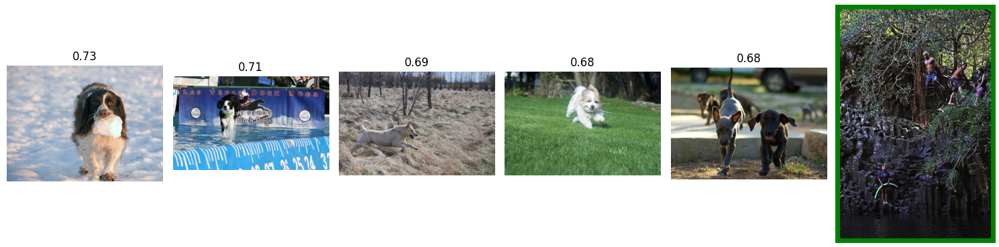

4/4 [==============================] - 0s 1ms/step

-------------------- A black and white dog biting onto a chunk of ice . --------------------



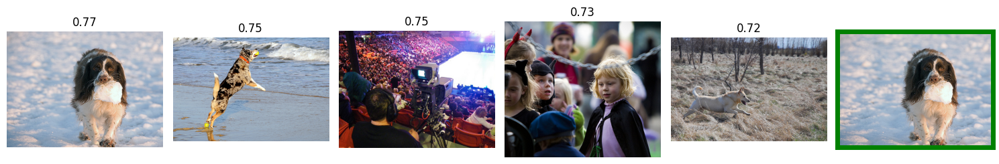

4/4 [==============================] - 0s 817us/step

-------------------- A red high speed racing boat skips across the water . --------------------



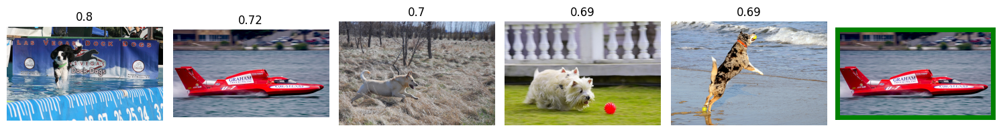


-------------------- Two children play with a white dog . --------------------

This image is unavailable in your country in compliance with local laws.

4/4 [==============================] - 0s 746us/step

-------------------- A man waterskiing through the air near a dock . --------------------



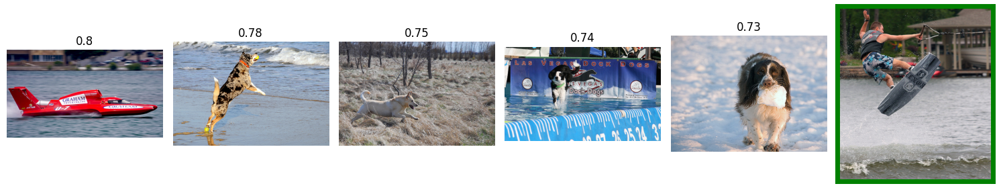


-------------------- a boy in a blue top is jumping off some rocks in the woods . --------------------

This image is unavailable in your country in compliance with local laws.

4/4 [==============================] - 0s 759us/step

-------------------- A white bulldog sitting on a tree stump gives paw to an older woman wearing a black jacket . --------------------



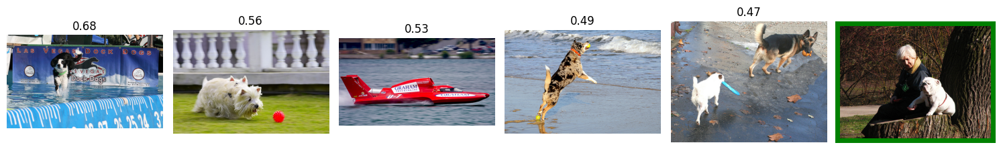


-------------------- Two teenage girls dressed like hippies walk and talk . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- Boy wearing a green and white soccer uniform running through the grass . --------------------

This image is unavailable in your country in compliance with local laws.

4/4 [==============================] - 0s 1ms/step

-------------------- A man in a black t-shirt is jumping something on his orange bike . --------------------



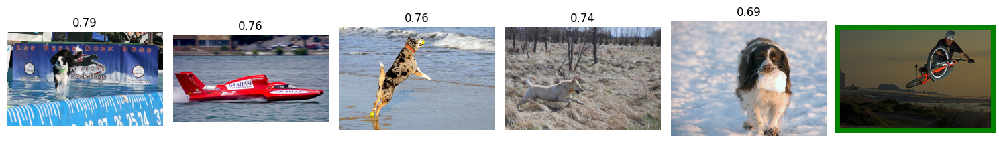

In [75]:
for text in text_test:
    get_picture(text)

In [76]:
requests = ['multiple trees',
            'dog is playing',
            'We do business around the world',
            'man in the park',
            'hollidays'
           ]

4/4 [==============================] - 0s 8ms/step

-------------------- multiple trees --------------------



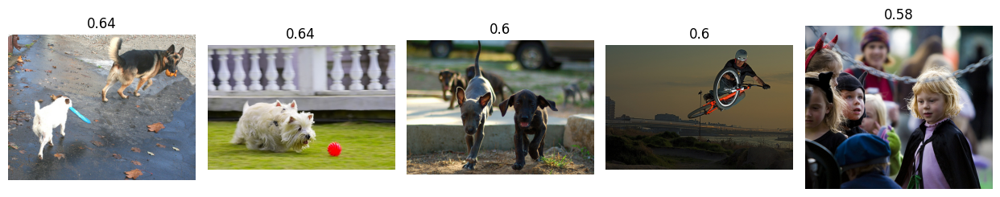

4/4 [==============================] - 0s 819us/step

-------------------- dog is playing --------------------



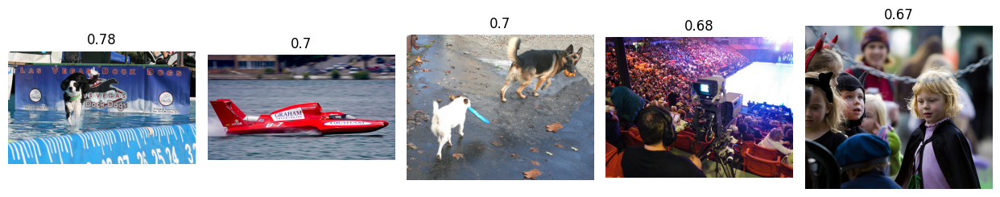

4/4 [==============================] - 0s 1ms/step

-------------------- We do business around the world --------------------



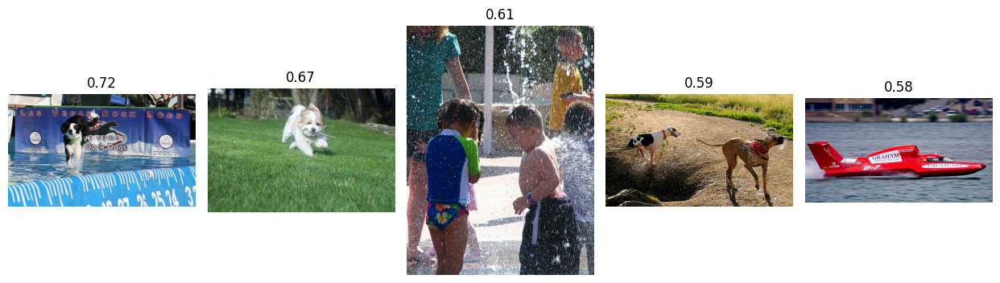

4/4 [==============================] - 0s 1ms/step

-------------------- man in the park --------------------



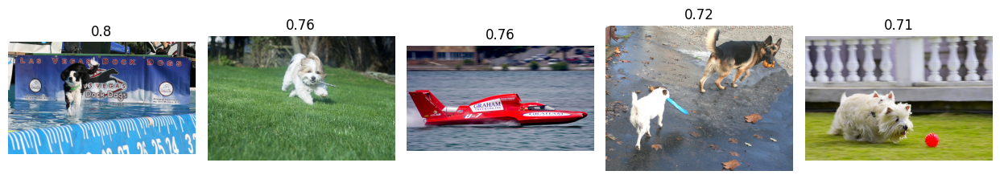

4/4 [==============================] - 0s 1ms/step

-------------------- hollidays --------------------



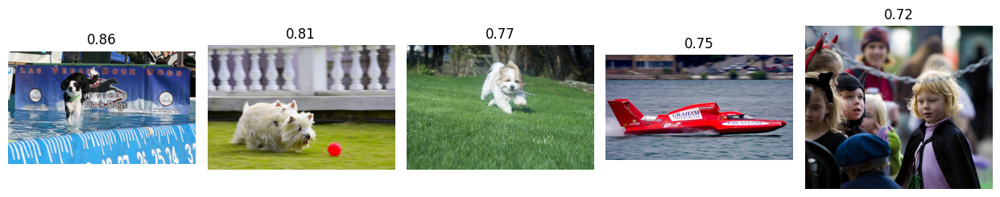

In [77]:
for text in requests:
    get_picture(text)

# Заключение

В рамках проекта был создан MVP для системы поиска изображений по фотографии.

В ходе работы для векторизации изображений использовалась сеть ResNet50, а для текстовых эмбеддингов BERT base cased EN.

После объединения признаков и выделения целей (экспертные оценки схожести описания и картинок), было произведено исследование трех моделей для оценки схожести:

LinearRegression
RandomForestRegressor
Нейронная сеть
Наилучший результат показала нейронная сеть, с которой и проводилось тестирование.

В рамках теста была создана функция, возвращающя 5 наиболее походходящих под описание фотографий, при этом для теста использовались как уже имеющиеся описания, так и случайные фразы.

К сожалению, MVP показывает низкую стабильность с точки зрения предоставления релевантных резульатов. Лишь в некоторых случаях в выдачу попадает верная картинка и, чуть чаще, попадают картинки связанные тематически. Есть вероятность, что предоставленный датасет содержит слишком мало данных для поиска хотябы одного дополнительного изображения, связанного с предоставленным описанием. Также улучшить показатели сети могло бы увеличение предоставленных данных как для тренировки, так и для тестирования.